<a href="https://colab.research.google.com/github/jumbokh/ML-Class/blob/main/notebook/CNN_2_Kaggle_facial_point.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Source: https://www.kaggle.com/c/facial-keypoints-detection/overview

further study https://www.itread01.com/content/1575533165.html

需要在 kaggle 註冊才可以拿到 username and key 的資訊

需要參加賽事才能夠下載資料

In [ ]:
import pandas as pd
import numpy as np

In [ ]:
import json
import os
import os.path
from IPython.display import clear_output as clear

api_token = {"username":"patrickruan","key":"8dd5c1e54618b614d148b66692be721d"}

if not os.path.exists("/root/.kaggle"):
    os.makedirs("/root/.kaggle")
 
with open('/root/.kaggle/kaggle.json', 'w') as file:
    json.dump(api_token, file)
!chmod 600 /root/.kaggle/kaggle.json
 
os.chdir('/content')
!kaggle competitions download -c facial-keypoints-detection
# !kaggle competitions download -d ..??./facial-keypoints-detection

!unzip facial-keypoints-detection.zip 
!unzip training.zip 

#clear()
#clear()

 31% 5.00M/16.0M [00:00<00:00, 13.0MB/s]
100% 16.0M/16.0M [00:00<00:00, 36.1MB/s]
  0% 0.00/843k [00:00<?, ?B/s]
100% 843k/843k [00:00<00:00, 117MB/s]
  0% 0.00/201k [00:00<?, ?B/s]
100% 201k/201k [00:00<00:00, 210MB/s]
 98% 59.0M/60.1M [00:00<00:00, 67.9MB/s]
100% 60.1M/60.1M [00:00<00:00, 102MB/s] 
unzip:  cannot find or open facial-keypoints-detection.zip, facial-keypoints-detection.zip.zip or facial-keypoints-detection.zip.ZIP.
Archive:  training.zip
  inflating: training.csv            


In [ ]:
'''
import json
import os
import os.path
from IPython.display import clear_output as clear


from google.colab import drive
drive.mount('/content/drive')

!cp drive/MyDrive/kaggle_token.py ./kaggle_token.py
from kaggle_token import token
api_token = token("3b8")


if not os.path.exists("/root/.kaggle"):
    os.makedirs("/root/.kaggle")
 
with open('/root/.kaggle/kaggle.json', 'w') as file:
    json.dump(api_token, file)
!chmod 600 /root/.kaggle/kaggle.json
 
os.chdir('/content')
!kaggle competitions download -c facial-keypoints-detection
!unzip facial-keypoints-detection.zip 
!unzip training.zip 

clear()


del api_token
!rm kaggle_token.py
'''

'\nimport json\nimport os\nimport os.path\nfrom IPython.display import clear_output as clear\n\n\nfrom google.colab import drive\ndrive.mount(\'/content/drive\')\n\n!cp drive/MyDrive/kaggle_token.py ./kaggle_token.py\nfrom kaggle_token import token\napi_token = token("3b8")\n\n\nif not os.path.exists("/root/.kaggle"):\n    os.makedirs("/root/.kaggle")\n \nwith open(\'/root/.kaggle/kaggle.json\', \'w\') as file:\n    json.dump(api_token, file)\n!chmod 600 /root/.kaggle/kaggle.json\n \nos.chdir(\'/content\')\n!kaggle competitions download -c facial-keypoints-detection\n!unzip facial-keypoints-detection.zip \n!unzip training.zip \n\nclear()\n\n\ndel api_token\n!rm kaggle_token.py\n'

In [ ]:
import numpy as np
import pandas as pd #
import matplotlib.pyplot as plt

df = pd.read_csv('training.csv')

In [ ]:
df.head(10)
df.columns
df.Image[0]
type(df.Image[0])
df

,left_eye_center_x,left_eye_center_y,right_eye_center_x,right_eye_center_y,left_eye_inner_corner_x,left_eye_inner_corner_y,left_eye_outer_corner_x,left_eye_outer_corner_y,right_eye_inner_corner_x,right_eye_inner_corner_y,right_eye_outer_corner_x,right_eye_outer_corner_y,left_eyebrow_inner_end_x,left_eyebrow_inner_end_y,left_eyebrow_outer_end_x,left_eyebrow_outer_end_y,right_eyebrow_inner_end_x,right_eyebrow_inner_end_y,right_eyebrow_outer_end_x,right_eyebrow_outer_end_y,nose_tip_x,nose_tip_y,mouth_left_corner_x,mouth_left_corner_y,mouth_right_corner_x,mouth_right_corner_y,mouth_center_top_lip_x,mouth_center_top_lip_y,mouth_center_bottom_lip_x,mouth_center_bottom_lip_y,Image
0,66.033564,39.002274,30.227008,36.421678,59.582075,39.647423,73.130346,39.969997,36.356571,37.389402,23.452872,37.389402,56.953263,29.033648,80.227128,32.228138,40.227609,29.002322,16.356379,29.647471,44.420571,57.066803,61.195308,79.970165,28.614496,77.388992,43.312602,72.935459,43.130707,84.485774,238 236 237 238 240 240 239 241 241 243 240 23...
1,64.332936,34.970077,29.949277,33.448715,58.856170,35.274349,70.722723,36.187166,36.034723,34.361532,24.472511,33.144443,53.987404,28.275949,78.634213,30.405923,42.728851,26.146043,16.865362,27.058860,48.206298,55.660936,56.421447,76.352000,35.122383,76.047660,46.684596,70.266553,45.467915,85.480170,219 215 204 196 204 211 212 200 180 168 178 19...
2,65.057053,34.909642,30.903789,34.909642,59.412000,36.320968,70.984421,36.320968,37.678105,36.320968,24.976421,36.603221,55.742526,27.570947,78.887368,32.651621,42.193895,28.135453,16.791158,32.087116,47.557263,53.538947,60.822947,73.014316,33.726316,72.732000,47.274947,70.191789,47.274947,78.659368,144 142 159 180 188 188 184 180 167 132 84 59 ...
3,65.225739,37.261774,32.023096,37.261774,60.003339,39.127179,72.314713,38.380967,37.618643,38.754115,25.307270,38.007903,56.433809,30.929864,77.910261,31.665725,41.671513,31.049990,20.458017,29.909343,51.885078,54.166539,65.598887,72.703722,37.245496,74.195478,50.303165,70.091687,51.561183,78.268383,193 192 193 194 194 194 193 192 168 111 50 12 ...
4,66.725301,39.621261,32.244810,38.042032,58.565890,39.621261,72.515926,39.884466,36.982380,39.094852,22.506110,38.305237,57.249571,30.672177,77.762945,31.737247,38.035436,30.935382,15.925870,30.672177,43.299534,64.889521,60.671411,77.523239,31.191755,76.997301,44.962748,73.707387,44.227141,86.871166,147 148 160 196 215 214 216 217 219 220 206 18...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7044,67.402546,31.842551,29.746749,38.632942,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,48.265961,67.029093,NaN,NaN,NaN,NaN,NaN,NaN,50.426637,79.683921,71 74 85 105 116 128 139 150 170 187 201 209 2...
7045,66.134400,38.365501,30.478626,39.950198,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,47.910346,66.626011,NaN,NaN,NaN,NaN,NaN,NaN,50.287397,77.983023,60 60 62 57 55 51 49 48 50 53 56 56 106 89 77 ...
7046,66.690732,36.845221,31.666420,39.685042,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,49.462572,67.515161,NaN,NaN,NaN,NaN,NaN,NaN,49.462572,78.117120,74 74 74 78 79 79 79 81 77 78 80 73 72 81 77 1...
7047,70.965082,39.853666,30.543285,40.772339,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,50.754202,66.724988,NaN,NaN,NaN,NaN,NaN,NaN,50.065186,79.586447,254 254 254 254 254 238 193 145 121 118 119 10...


In [ ]:
df.Image[0]
df['Image'][0]

'238 236 237 238 240 240 239 241 241 243 240 239 231 212 190 173 148 122 104 92 79 73 74 73 73 74 81 74 60 64 75 86 93 102 100 105 109 114 121 127 132 134 137 137 140 139 138 137 137 140 141 143 144 147 148 149 147 147 148 145 147 144 146 147 147 143 134 130 130 128 116 104 98 90 82 78 85 88 86 80 77 87 108 111 115 128 133 188 242 252 250 248 251 250 250 250 235 238 236 238 238 237 238 242 241 239 237 233 215 195 187 156 119 103 93 78 68 73 75 75 72 75 70 61 66 77 91 96 106 108 113 120 125 131 134 138 135 138 139 145 144 144 142 140 141 141 148 147 150 149 152 151 149 150 147 148 144 148 144 146 146 143 139 128 132 135 128 112 104 97 87 78 79 83 85 83 75 75 89 109 111 117 117 130 194 243 251 249 250 249 250 251 237 236 237 238 237 238 241 238 238 238 241 221 195 187 163 124 106 95 81 68 70 73 73 72 73 69 65 74 82 94 103 110 111 119 127 135 140 139 144 144 145 143 143 143 146 144 144 147 146 148 147 150 146 147 150 150 149 147 147 144 147 144 149 146 144 144 144 140 131 133 133 125 110 

In [ ]:
px = np.fromstring(df.Image[0], dtype = int, sep = ' ').shape[0]
print(px)

for count, i in enumerate(df.Image):
  if np.fromstring(df.Image[count], dtype = int, sep = ' ').shape[0] != px:
    print(count) 

9216


In [ ]:
df=df.dropna()
print(df.shape)
df.info()

(2140, 31)
<class 'pandas.core.frame.DataFrame'>
Int64Index: 2140 entries, 0 to 2283
Data columns (total 31 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   left_eye_center_x          2140 non-null   float64
 1   left_eye_center_y          2140 non-null   float64
 2   right_eye_center_x         2140 non-null   float64
 3   right_eye_center_y         2140 non-null   float64
 4   left_eye_inner_corner_x    2140 non-null   float64
 5   left_eye_inner_corner_y    2140 non-null   float64
 6   left_eye_outer_corner_x    2140 non-null   float64
 7   left_eye_outer_corner_y    2140 non-null   float64
 8   right_eye_inner_corner_x   2140 non-null   float64
 9   right_eye_inner_corner_y   2140 non-null   float64
 10  right_eye_outer_corner_x   2140 non-null   float64
 11  right_eye_outer_corner_y   2140 non-null   float64
 12  left_eyebrow_inner_end_x   2140 non-null   float64
 13  left_eyebrow_inner_end_y   2140 non-n

In [ ]:
# alternative 1

df['Image'] = df['Image'].apply(lambda x: np.fromstring(x, dtype = int, sep = ' ').reshape(96, 96, 1))/255.

len(df['Image']) # 2140
img = np.zeros([len(df['Image']), 96,96, 1])
for i, j in enumerate(df['Image']):
  img[i]=j 

print(img.shape)

(2140, 96, 96, 1)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


In [ ]:
'''
# Alternative 2 
df['Image'] = df['Image'].str.split(' ')
type(df['Image'][0])

img = np.zeros([len(df['Image']), 96,96, 1])
for i, j in enumerate(df['Image']):
  k = [int(k) for k in j]
  k = np.array(k).reshape(96,96,1)/255.
  img[i]=k
'''


"\n# Alternative 2 \ndf['Image'] = df['Image'].str.split(' ')\ntype(df['Image'][0])\n\nimg = np.zeros([len(df['Image']), 96,96, 1])\nfor i, j in enumerate(df['Image']):\n  k = [int(k) for k in j]\n  k = np.array(k).reshape(96,96,1)/255.\n  img[i]=k\n"

In [ ]:
columns = list(df.columns)
columns.remove('Image')
columns
label = df[columns].to_numpy()

In [ ]:
import sklearn
from sklearn.model_selection import train_test_split
# (x, y), (x, y) = keras
train_x, test_x, train_y, test_y = train_test_split(img, label, test_size = 140, random_state = 42)

In [ ]:
print(train_x.shape)
print(test_x.shape)
print(train_y.shape)
print(test_y.shape)

(2000, 96, 96, 1)
(140, 96, 96, 1)
(2000, 30)
(140, 30)


In [ ]:
from keras.models import Sequential
from keras.layers import Conv2D, MaxPool2D, Flatten, Dense, Dropout, BatchNormalization, AveragePooling2D, LeakyReLU

In [ ]:
def conv2d(filter= 16, grid =3):
    model = Sequential()
    model.add(Conv2D(filter, (grid, grid), activation = 'relu'))
    model.add(BatchNormalization())
    #model.add(MaxPool2D((2,2)))
    model.add(AveragePooling2D(2,2))
    return model

In [ ]:
model = Sequential()
model.add(BatchNormalization(input_shape=(96,96,1)))
model.add(conv2d(200,5))
model.add(conv2d(100))
model.add(conv2d(84,3))
model.add(Flatten())
model.add(Dense(512, activation='relu'))
model.add(Dense(256, activation='relu'))
model.add(Dense(30))# , activation='sigmoid'))
model.summary()


Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
batch_normalization (BatchNo (None, 96, 96, 1)         4         
_________________________________________________________________
sequential_1 (Sequential)    (None, 46, 46, 200)       6000      
_________________________________________________________________
sequential_2 (Sequential)    (None, 22, 22, 100)       180500    
_________________________________________________________________
sequential_3 (Sequential)    (None, 10, 10, 84)        76020     
_________________________________________________________________
flatten (Flatten)            (None, 8400)              0         
_________________________________________________________________
dense (Dense)                (None, 512)               4301312   
_________________________________________________________________
dense_1 (Dense)              (None, 256)               1

In [ ]:
model.compile(optimizer='adam',loss='mse',metrics=['accuracy','mse'])
history = model.fit(train_x,train_y,validation_split=0.2, batch_size=64, epochs=40, verbose=1)

Epoch 1/40
25/25 [==============================] - 18s 62ms/step - loss: 531.4215 - accuracy: 0.4575 - mse: 531.4215 - val_loss: 2105.6997 - val_accuracy: 0.1650 - val_mse: 2105.6997
Epoch 2/40
25/25 [==============================] - 1s 52ms/step - loss: 29.8743 - accuracy: 0.6475 - mse: 29.8743 - val_loss: 1966.4797 - val_accuracy: 0.3625 - val_mse: 1966.4797
Epoch 3/40
25/25 [==============================] - 1s 50ms/step - loss: 14.8049 - accuracy: 0.6931 - mse: 14.8049 - val_loss: 1628.4370 - val_accuracy: 0.4375 - val_mse: 1628.4370
Epoch 4/40
25/25 [==============================] - 1s 50ms/step - loss: 14.7572 - accuracy: 0.7188 - mse: 14.7572 - val_loss: 1319.4465 - val_accuracy: 0.5075 - val_mse: 1319.4465
Epoch 5/40
25/25 [==============================] - 1s 50ms/step - loss: 9.1929 - accuracy: 0.7350 - mse: 9.1929 - val_loss: 958.4271 - val_accuracy: 0.6350 - val_mse: 958.4271
Epoch 6/40
25/25 [==============================] - 1s 50ms/step - loss: 9.5755 - accuracy: 0.73

In [ ]:
pred = model.predict(test_x)

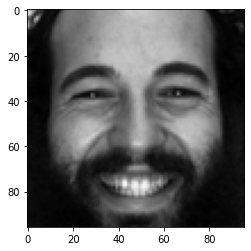

In [ ]:
import matplotlib.pyplot as plt

plt.imshow(test_x[0].reshape(96,96), cmap = 'gray')

In [ ]:
96*96 #labelimg, labelme

9216

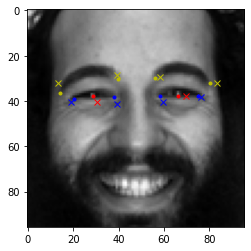

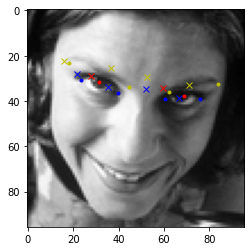

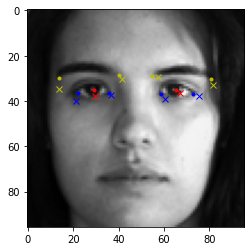

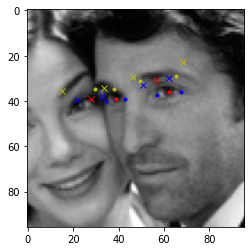

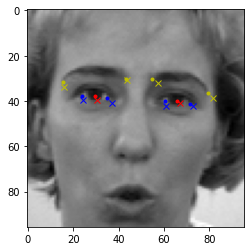

...

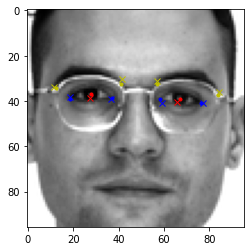

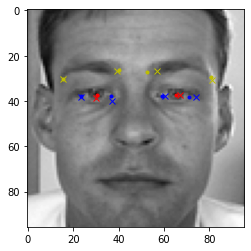

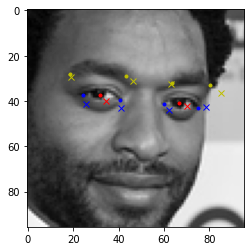

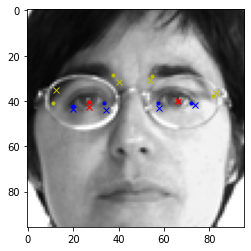

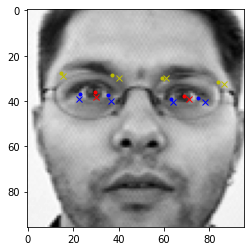

In [ ]:
n=0
import matplotlib.pyplot as plt
def check(n = 0, compare = False):
  plt.imshow(test_x[n].reshape(96,96), cmap ='gray')
  plt.plot(pred[n][0], pred[n][1], 'rx')
  plt.plot(pred[n][2], pred[n][3], 'rx')
  plt.plot(pred[n][4], pred[n][5], 'bx')
  plt.plot(pred[n][6], pred[n][7], 'bx')
  plt.plot(pred[n][8], pred[n][9], 'bx')
  plt.plot(pred[n][10], pred[n][11], 'bx')
  plt.plot(pred[n][12], pred[n][13], 'yx')
  plt.plot(pred[n][14], pred[n][15], 'yx')
  plt.plot(pred[n][16], pred[n][17], 'yx')
  plt.plot(pred[n][18], pred[n][19], 'yx')
  
  if compare == True:
    plt.plot(test_y[n][0], test_y[n][1], 'r.')
    plt.plot(test_y[n][2], test_y[n][3], 'r.')
    plt.plot(test_y[n][4], test_y[n][5], 'b.')
    plt.plot(test_y[n][6], test_y[n][7], 'b.')
    plt.plot(test_y[n][8], test_y[n][9], 'b.')
    plt.plot(test_y[n][10], test_y[n][11], 'b.')
    plt.plot(test_y[n][12], test_y[n][13], 'y.')
    plt.plot(test_y[n][14], test_y[n][15], 'y.')
    plt.plot(test_y[n][16], test_y[n][17], 'y.')
    plt.plot(test_y[n][18], test_y[n][19], 'y.')

  plt.show()  

for i in range(140):
  check(i, True)

In [ ]:
model = Sequential()

model.add(Conv2D(32, (3,3), padding='same', use_bias=False, input_shape=(96,96,1)))
model.add(LeakyReLU(alpha = 0.1))
model.add(BatchNormalization())

model.add(Conv2D(32, (3,3), padding='same', use_bias=False))
model.add(LeakyReLU(alpha = 0.1))
model.add(BatchNormalization())
model.add(MaxPool2D(pool_size=(2, 2)))

model.add(Conv2D(64, (3,3), padding='same', use_bias=False))
model.add(LeakyReLU(alpha = 0.1))
model.add(BatchNormalization())

model.add(Conv2D(64, (3,3), padding='same', use_bias=False))
model.add(LeakyReLU(alpha = 0.1))
model.add(BatchNormalization())
model.add(MaxPool2D(pool_size=(2, 2)))

model.add(Conv2D(96, (3,3), padding='same', use_bias=False))
model.add(LeakyReLU(alpha = 0.1))
model.add(BatchNormalization())

model.add(Conv2D(96, (3,3), padding='same', use_bias=False))
model.add(LeakyReLU(alpha = 0.1))
model.add(BatchNormalization())
model.add(MaxPool2D(pool_size=(2, 2)))

model.add(Conv2D(128, (3,3),padding='same', use_bias=False))
model.add(BatchNormalization())
model.add(LeakyReLU(alpha = 0.1))
model.add(BatchNormalization())

model.add(Conv2D(128, (3,3),padding='same', use_bias=False))
model.add(LeakyReLU(alpha = 0.1))
model.add(BatchNormalization())
model.add(MaxPool2D(pool_size=(2, 2)))

model.add(Conv2D(256, (3,3),padding='same',use_bias=False))
model.add(LeakyReLU(alpha = 0.1))
model.add(BatchNormalization())

model.add(Conv2D(256, (3,3),padding='same',use_bias=False))
model.add(LeakyReLU(alpha = 0.1))
model.add(BatchNormalization())
model.add(MaxPool2D(pool_size=(2, 2)))

model.add(Conv2D(512, (3,3), padding='same', use_bias=False))
model.add(LeakyReLU(alpha = 0.1))
model.add(BatchNormalization())

model.add(Conv2D(512, (3,3), padding='same', use_bias=False))
model.add(LeakyReLU(alpha = 0.1))
model.add(BatchNormalization())


model.add(Flatten())
model.add(Dense(512,activation='relu'))
model.add(Dropout(0.1))
model.add(Dense(30))
model.summary()

Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_3 (Conv2D)            (None, 96, 96, 32)        288       
_________________________________________________________________
leaky_re_lu (LeakyReLU)      (None, 96, 96, 32)        0         
_________________________________________________________________
batch_normalization_4 (Batch (None, 96, 96, 32)        128       
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 96, 96, 32)        9216      
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 96, 96, 32)        0         
_________________________________________________________________
batch_normalization_5 (Batch (None, 96, 96, 32)        128       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 48, 48, 32)       

In [ ]:
model.compile(optimizer='adam', 
              loss='mean_squared_error',
              metrics=['mae'])
history1=model.fit(train_x,train_y,epochs = 500,batch_size = 64,validation_split=0.2)

Epoch 1/500
25/25 [==============================] - 3s 53ms/step - loss: 297.5279 - mae: 10.9878 - val_loss: 188.9319 - val_mae: 12.4017
Epoch 2/500
25/25 [==============================] - 1s 39ms/step - loss: 30.4022 - mae: 4.3462 - val_loss: 78.7237 - val_mae: 7.9330
Epoch 3/500
25/25 [==============================] - 1s 40ms/step - loss: 24.3067 - mae: 3.8723 - val_loss: 113.0992 - val_mae: 9.5455
Epoch 4/500
25/25 [==============================] - 1s 42ms/step - loss: 22.3463 - mae: 3.7101 - val_loss: 120.2595 - val_mae: 9.9215
Epoch 5/500
25/25 [==============================] - 1s 39ms/step - loss: 20.6044 - mae: 3.5592 - val_loss: 125.1822 - val_mae: 9.9988
Epoch 6/500
25/25 [==============================] - 1s 39ms/step - loss: 18.4021 - mae: 3.3640 - val_loss: 102.4938 - val_mae: 9.0314
Epoch 7/500
25/25 [==============================] - 1s 39ms/step - loss: 17.2750 - mae: 3.2595 - val_loss: 96.4685 - val_mae: 8.7172
Epoch 8/500
25/25 [==============================] - 1

In [ ]:
pred = model.predict(test_x)

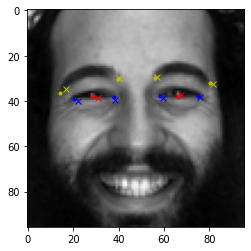

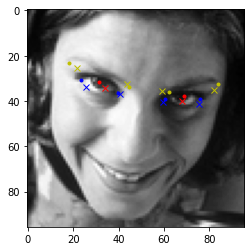

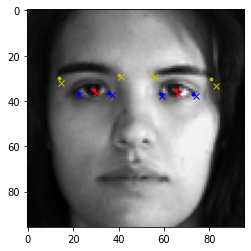

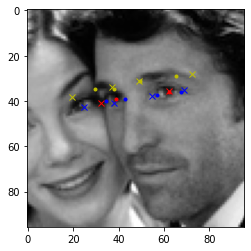

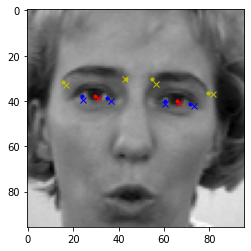

...

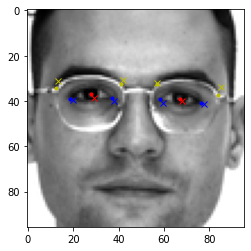

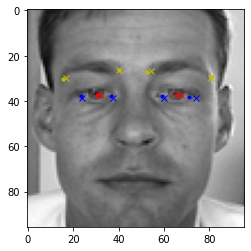

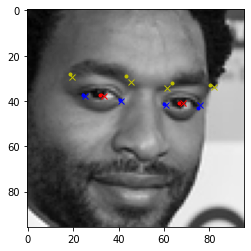

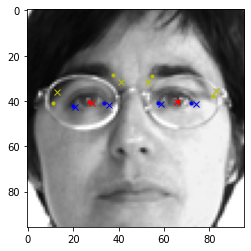

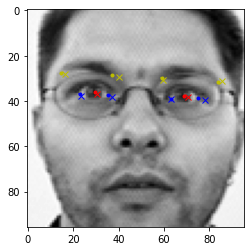

In [ ]:
n=0
import matplotlib.pyplot as plt
def check(n = 0, compare = False):
  plt.imshow(test_x[n].reshape(96,96), cmap ='gray')
  plt.plot(pred[n][0], pred[n][1], 'rx')
  plt.plot(pred[n][2], pred[n][3], 'rx')
  plt.plot(pred[n][4], pred[n][5], 'bx')
  plt.plot(pred[n][6], pred[n][7], 'bx')
  plt.plot(pred[n][8], pred[n][9], 'bx')
  plt.plot(pred[n][10], pred[n][11], 'bx')
  plt.plot(pred[n][12], pred[n][13], 'yx')
  plt.plot(pred[n][14], pred[n][15], 'yx')
  plt.plot(pred[n][16], pred[n][17], 'yx')
  plt.plot(pred[n][18], pred[n][19], 'yx')
  
  if compare == True:
    plt.plot(test_y[n][0], test_y[n][1], 'r.')
    plt.plot(test_y[n][2], test_y[n][3], 'r.')
    plt.plot(test_y[n][4], test_y[n][5], 'b.')
    plt.plot(test_y[n][6], test_y[n][7], 'b.')
    plt.plot(test_y[n][8], test_y[n][9], 'b.')
    plt.plot(test_y[n][10], test_y[n][11], 'b.')
    plt.plot(test_y[n][12], test_y[n][13], 'y.')
    plt.plot(test_y[n][14], test_y[n][15], 'y.')
    plt.plot(test_y[n][16], test_y[n][17], 'y.')
    plt.plot(test_y[n][18], test_y[n][19], 'y.')

  plt.show()  

for i in range(140):
  check(i, True)